## Setup

In [1]:
# Base libraries
import os
from os.path import isfile, join
import numpy as np
import pandas as pd
from umap import UMAP
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
# NetworkX
import networkx as nx
import osmnx as ox
# OS environment setup
from local_directories import *

In [2]:
# Reset random seeds
random_seed = 2674
# Other
neighbourhood_min_nodes = 8
max_distance = 500

## Load data

In [3]:
# Load Leciester's graph
leicester_osmnx_graph = ox.io.load_graphml(bulk_storage_directory + "/osmnx/raw_excluded/leicester-1864.graphml")
leicester_osmnx_graph_prj = ox.project_graph(leicester_osmnx_graph)

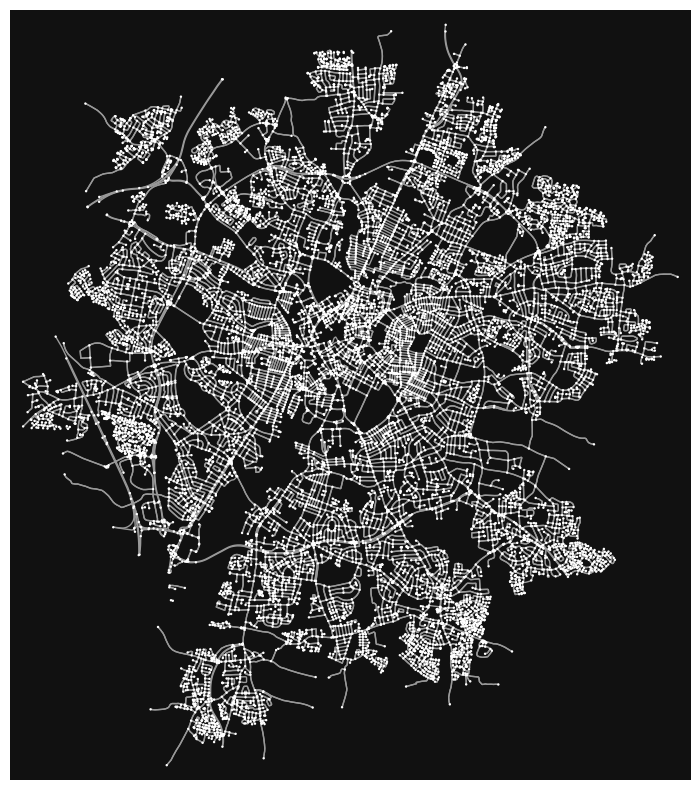

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [4]:
ox.plot_graph(
    leicester_osmnx_graph_prj,
    node_size=3,
    figsize=(10, 10))

In [5]:
# Convert graph to dataframe version
leicester_osmnx_graph_prj_df = None
for node in leicester_osmnx_graph_prj:
    node_dict = leicester_osmnx_graph_prj.nodes[node]
    node_dict["osmnx_node_id"] = int(node)
    # node_dict["osmnx_node_id"] = str(node)
    if leicester_osmnx_graph_prj_df is None:
        leicester_osmnx_graph_prj_df = pd.DataFrame.from_dict([node_dict])
    else:
        leicester_osmnx_graph_prj_df = pd.concat([leicester_osmnx_graph_prj_df, pd.DataFrame.from_dict([node_dict])])
leicester_osmnx_graph_prj_df.head()

,y,x,street_count,elevation,elevation_aster,elevation_srtm,lon,lat,osmnx_node_id,ref,highway
0,5.829804e+06,622151.977595,3,72.0,35,72,-1.196195,52.604506,194739,NaN,NaN
0,5.829991e+06,622098.041002,3,72.0,45,72,-1.196922,52.606196,1551014281,NaN,NaN
0,5.828827e+06,622259.813792,2,79.0,57,79,-1.194965,52.595696,326312,21,motorway_junction
0,5.830107e+06,622077.742140,3,79.0,43,79,-1.197179,52.607245,326320,21,motorway_junction
0,5.829673e+06,622220.645785,3,74.0,35,74,-1.195230,52.603314,2627867454,NaN,NaN


In [6]:
# Load Leciester's base stats
leicester_osmnx_basic_stats = pd.read_csv(this_repo_directory + "/data/leicester-1864_basic_stats.csv")
leicester_osmnx_basic_stats = leicester_osmnx_basic_stats.rename(columns={"node_id":"osmnx_node_id"})
leicester_osmnx_basic_stats.head()

,n,m,k_avg,edge_length_total,edge_length_avg,streets_per_node_avg,streets_per_node_counts,streets_per_node_proportions,intersection_count,street_length_total,street_segment_count,street_length_avg,circuity_avg,self_loop_proportion,osmnx_node_id,0
0,16.0,17.0,2.125000,4425.716,260.336235,2.937500,"{0: 0, 1: 0, 2: 1, 3: 15}","{0: 0.0, 1: 0.0, 2: 0.0625, 3: 0.9375}",16.0,4425.716,17.0,260.336235,1.076026,0.0,194739.0,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,9.0,8.0,1.777778,1283.330,160.416250,2.888889,"{0: 0, 1: 0, 2: 1, 3: 8}","{0: 0.0, 1: 0.0, 2: 0.1111111111111111, 3: 0.8...",9.0,1283.330,8.0,160.416250,1.042156,0.0,326313.0,NaN
3,13.0,14.0,2.153846,2175.541,155.395786,3.000000,"{0: 0, 1: 0, 2: 0, 3: 13}","{0: 0.0, 1: 0.0, 2: 0.0, 3: 1.0}",13.0,2175.541,14.0,155.395786,1.022110,0.0,326320.0,NaN
4,16.0,17.0,2.125000,2729.609,160.565235,3.000000,"{0: 0, 1: 0, 2: 0, 3: 16}","{0: 0.0, 1: 0.0, 2: 0.0, 3: 1.0}",16.0,2729.609,17.0,160.565235,1.033021,0.0,326321.0,NaN


In [7]:
# Load Leciester's embeddings
leicester_emb_df = pd.read_csv(this_repo_directory + "/data/leicester-1864_emb_gnnuf_model_v0-5.csv")
leicester_emb_df.head()

,osmnx_node_id,EMB000,EMB001
0,337976,-0.212304,-0.563564
1,337979,-0.322662,-0.882213
2,337983,-0.009132,0.948856
3,337985,-0.136350,0.965531
4,337986,-0.203456,0.447374


## Explore embeddings

In [8]:
fig = px.scatter(
    leicester_emb_df,
    x="EMB000",
    y="EMB001",
    hover_data=['osmnx_node_id'],
    width=800, height=800
)
fig.update_layout({"plot_bgcolor": "#ffffff"})
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

In [9]:
for node in leicester_osmnx_graph_prj.nodes:
    if len(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB000"].values) == 0:
        leicester_osmnx_graph_prj.nodes[node]["EMB000"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB001"] = None
    else:
        leicester_osmnx_graph_prj.nodes[node]["EMB000"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB000"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB001"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB001"].values)

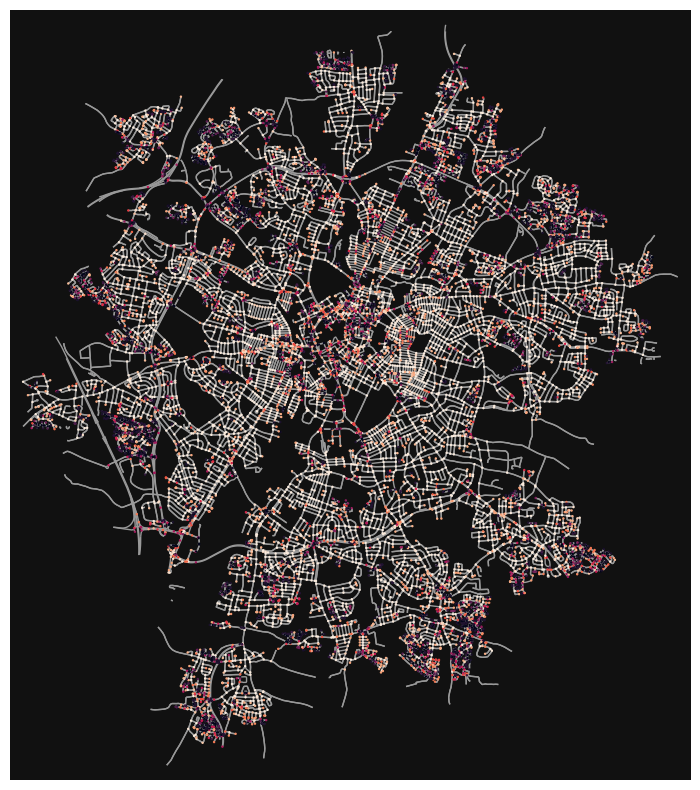

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [10]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB000"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=3,
    figsize=(10, 10))

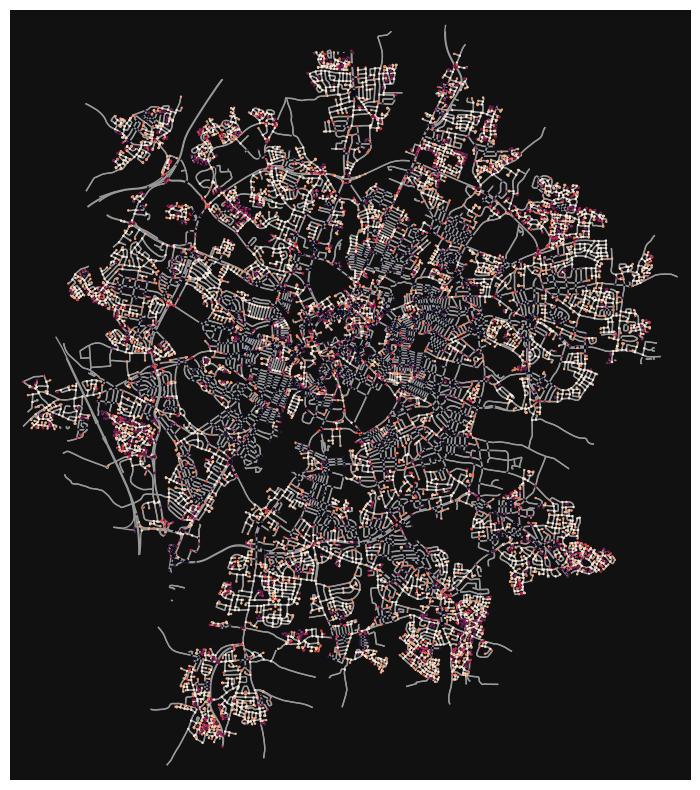

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [11]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB001"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=3,
    figsize=(10, 10))

## Correlations with basic stats

Checking correlations between EMB000 and EMB001 and all the basic statistics from OSMnx. No clear correlation found.

In [12]:
leicester_pairplot_df = pd.merge(
        leicester_emb_df[["osmnx_node_id", "EMB000", "EMB001"]],
        leicester_osmnx_basic_stats[["osmnx_node_id",
            "n", "m", "k_avg", "edge_length_total", "edge_length_avg",
            "streets_per_node_avg", "intersection_count", "street_length_total",
            "street_segment_count", "street_length_avg", "circuity_avg"]],
        on="osmnx_node_id"
    ).drop(columns=["osmnx_node_id"])

In [13]:
print(leicester_pairplot_df.corr(method="kendall"))

                        EMB000    EMB001         n         m     k_avg   
EMB000                1.000000 -0.050229  0.042863  0.082053  0.266941  \
EMB001               -0.050229  1.000000 -0.161911 -0.168000 -0.035949   
n                     0.042863 -0.161911  1.000000  0.903200 -0.019202   
m                     0.082053 -0.168000  0.903200  1.000000  0.080372   
k_avg                 0.266941 -0.035949 -0.019202  0.080372  1.000000   
edge_length_total     0.226520 -0.198120  0.619964  0.695611  0.287983   
edge_length_avg       0.285335 -0.039478 -0.248455 -0.180095  0.420486   
streets_per_node_avg  0.246053 -0.197393  0.155012  0.200487  0.299551   
intersection_count    0.103035 -0.191886  0.847989  0.863775  0.062570   
street_length_total   0.210639 -0.212141  0.647887  0.703902  0.221320   
street_segment_count  0.079704 -0.184823  0.904967  0.908216  0.033473   
street_length_avg     0.283270 -0.039187 -0.245817 -0.175778  0.436387   
circuity_avg         -0.048637  0.1309

## Check specific nodes

Checking the ego-network of the nodes with the most extreme values in each direction (min and max) for both UMAP0 and UMAP1

In [14]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 6782625866]

,osmnx_node_id,EMB000,EMB001
12711,6782625866,-0.999753,-0.943405


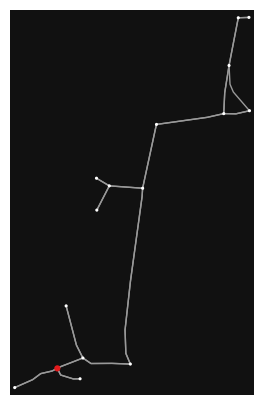

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [15]:
ego_6782625866 = nx.generators.ego_graph(
    leicester_osmnx_graph, 6782625866,
    radius=max_distance, undirected=True, distance="length")
ego_6782625866_prj = ox.project_graph(ego_6782625866)
ox.plot_graph(
    ego_6782625866_prj,
    node_size=[20 if node == 6782625866 else 5 for node in ego_6782625866_prj.nodes],
    node_color=["#e41a1c" if node == 6782625866 else "#ffffff" for node in ego_6782625866_prj.nodes],
    figsize=(5, 5)
)

In [16]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 354554417]

,osmnx_node_id,EMB000,EMB001
4733,354554417,-0.966505,0.982919


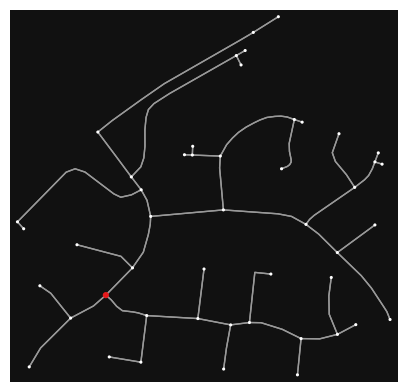

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [17]:
ego_354554417 = nx.generators.ego_graph(
    leicester_osmnx_graph, 354554417,
    radius=max_distance, undirected=True, distance="length")
ego_354554417_prj = ox.project_graph(ego_354554417)
ox.plot_graph(
    ego_354554417_prj,
    node_size=[20 if node == 354554417 else 5 for node in ego_354554417_prj.nodes],
    node_color=["#e41a1c" if node == 354554417 else "#ffffff" for node in ego_354554417_prj.nodes],
    figsize=(5, 5)
)

In [18]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 1179199412]

,osmnx_node_id,EMB000,EMB001
8021,1179199412,0.999113,0.99909


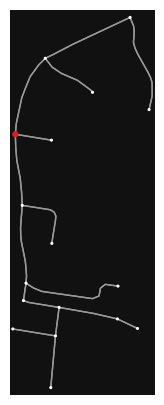

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [19]:
ego_1179199412 = nx.generators.ego_graph(
    leicester_osmnx_graph, 1179199412,
    radius=max_distance, undirected=True, distance="length")
ego_1179199412_prj = ox.project_graph(ego_1179199412)
ox.plot_graph(
    ego_1179199412_prj,
    node_size=[20 if node == 1179199412 else 5 for node in ego_1179199412_prj.nodes],
    node_color=["#e41a1c" if node == 1179199412 else "#ffffff" for node in ego_1179199412_prj.nodes],
    figsize=(5, 5)
)

In [20]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 2858142815]

,osmnx_node_id,EMB000,EMB001
11121,2858142815,0.002341,0.165836


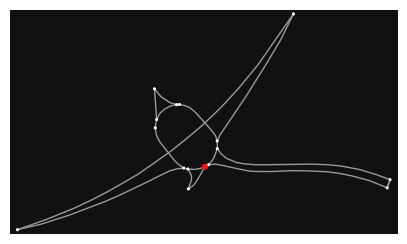

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [21]:
ego_2858142815 = nx.generators.ego_graph(
    leicester_osmnx_graph, 2858142815,
    radius=max_distance, undirected=True, distance="length")
ego_2858142815_prj = ox.project_graph(ego_2858142815)
ox.plot_graph(
    ego_2858142815_prj,
    node_size=[20 if node == 2858142815 else 5 for node in ego_2858142815_prj.nodes],
    node_color=["#e41a1c" if node == 2858142815 else "#ffffff" for node in ego_2858142815_prj.nodes],
    figsize=(5, 5)
)

In [22]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 296162322]

,osmnx_node_id,EMB000,EMB001
3845,296162322,0.99999,-0.999946


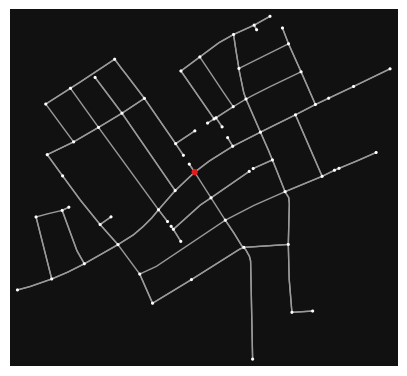

(<Figure size 500x500 with 1 Axes>, <Axes: >)

In [23]:
ego_296162322 = nx.generators.ego_graph(
    leicester_osmnx_graph, 296162322,
    radius=max_distance, undirected=True, distance="length")
ego_296162322_prj = ox.project_graph(ego_296162322)
ox.plot_graph(
    ego_296162322_prj,
    node_size=[20 if node == 296162322 else 5 for node in ego_296162322_prj.nodes],
    node_color=["#e41a1c" if node == 296162322 else "#ffffff" for node in ego_296162322_prj.nodes],
    figsize=(5, 5)
)

## Explore patterns

In [24]:
leicester_emb_patters_df = leicester_emb_df.copy()

In [25]:
from sklearn.cluster import DBSCAN
leicester_emb_df_clust = leicester_emb_df[["EMB000", "EMB001"]].dropna()
clust = DBSCAN(eps=0.05, min_samples=25)
leicester_emb_patters_df["clust"] = clust.fit_predict(leicester_emb_df_clust)
leicester_emb_patters_df["clust"] = leicester_emb_patters_df["clust"].apply(lambda x: str(x) if x>-1 else None)
leicester_emb_patters_df.head()

,osmnx_node_id,EMB000,EMB001,clust
0,337976,-0.212304,-0.563564,None
1,337979,-0.322662,-0.882213,None
2,337983,-0.009132,0.948856,0
3,337985,-0.136350,0.965531,0
4,337986,-0.203456,0.447374,None


In [26]:
leicester_emb_df.head()
fig = px.scatter(
    leicester_emb_patters_df,
    x="EMB000",
    y="EMB001",
    color="clust",
    hover_data=['osmnx_node_id'],
    width=800, height=800
)
fig.update_layout({"plot_bgcolor": "#ffffff"}, width=800, height=800)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

In [27]:
def bivariate_colour(x, limits):
    if x[0] is None or x[1] is None:
        return None
    else:
        if x[0] <= limits[0, 0]:
            if x[1] <= limits[1, 0]:
                # return "#e8e8e8"
                return "#e8e8e8"
            elif x[1] <= limits[1, 1]:
                # return "#cbb8d7"
                return "#e4acac"
            else:
                # return "#9972af"
                return "#c85a5a"
        if x[0] <= limits[0, 1]:
            if x[1] <= limits[1, 0]:
                # return "#e4d9ac"
                return "#b0d5df"
            elif x[1] <= limits[1, 1]:
                # return "#c8ada0"
                return "#ad9ea5"
            else:
                # return "#976b82"
                return "#985356"
        else:
            if x[1] <= limits[1, 0]:
                # return "#c8b35a"
                return "#64acbe"
            elif x[1] <= limits[1, 1]:
                # return "#af8e53"
                return "#627f8c"
            else:
                # return "#804d36"
                return "#574249"

leicester_emb_quantiles = leicester_emb_df[["EMB000", "EMB001"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_patters_df["bivariate_colour"] = leicester_emb_patters_df.apply(
    lambda x: bivariate_colour([x["EMB000"], x["EMB001"]], leicester_emb_quantiles), axis=1
)
leicester_emb_patters_df.head()

,osmnx_node_id,EMB000,EMB001,clust,bivariate_colour
0,337976,-0.212304,-0.563564,None,#e8e8e8
1,337979,-0.322662,-0.882213,None,#e8e8e8
2,337983,-0.009132,0.948856,0,#985356
3,337985,-0.136350,0.965531,0,#c85a5a
4,337986,-0.203456,0.447374,None,#e4acac


In [28]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    mode='markers',
    marker=dict(color=leicester_emb_patters_df.bivariate_colour)
))
fig.update_layout({"plot_bgcolor": "#ffffff"}, width=800, height=800)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

In [29]:
leicester_osmnx_bivariate = leicester_osmnx_graph_prj.copy()

for node in leicester_osmnx_bivariate.nodes:
    node_bivariate_colour = leicester_emb_patters_df.loc[leicester_emb_patters_df["osmnx_node_id"] == node]
    if node_bivariate_colour.empty:
        leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] = "#000000"
    else:
        leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] = node_bivariate_colour["bivariate_colour"].values[0]

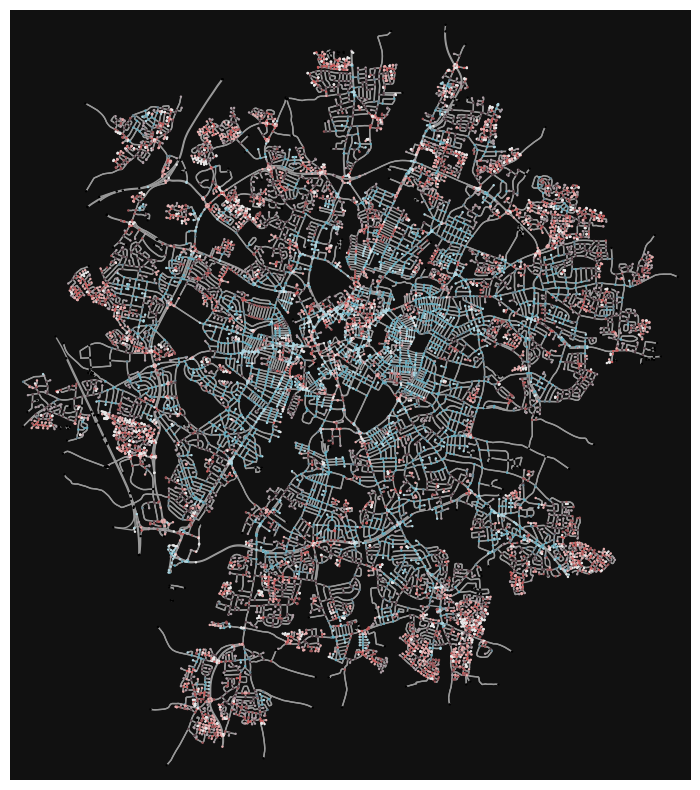

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [30]:
ox.plot_graph(
    leicester_osmnx_bivariate,
    node_color=[leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] for node in leicester_osmnx_bivariate.nodes],
    node_size=3,
    figsize=(10, 10))

In [31]:
import geopandas as gpd
leicester_gdf = gpd.GeoDataFrame(
    leicester_osmnx_graph_prj_df,
    geometry=gpd.points_from_xy(
        leicester_osmnx_graph_prj_df.lon,
        leicester_osmnx_graph_prj_df.lat
    ),
    crs="EPSG:4326"
).merge(leicester_emb_patters_df, on='osmnx_node_id', how='left').merge(leicester_osmnx_basic_stats, on='osmnx_node_id', how='left')
leicester_gdf.head()

,y,x,street_count,elevation,elevation_aster,elevation_srtm,lon,lat,osmnx_node_id,ref,...,streets_per_node_avg,streets_per_node_counts,streets_per_node_proportions,intersection_count,street_length_total,street_segment_count,street_length_avg,circuity_avg,self_loop_proportion,0
0,5.829804e+06,622151.977595,3,72.0,35,72,-1.196195,52.604506,194739,NaN,...,2.9375,"{0: 0, 1: 0, 2: 1, 3: 15}","{0: 0.0, 1: 0.0, 2: 0.0625, 3: 0.9375}",16.0,4425.716,17.0,260.336235,1.076026,0.0,NaN
1,5.829991e+06,622098.041002,3,72.0,45,72,-1.196922,52.606196,1551014281,NaN,...,3.0000,"{0: 0, 1: 0, 2: 0, 3: 12}","{0: 0.0, 1: 0.0, 2: 0.0, 3: 1.0}",12.0,2994.406,13.0,230.338923,1.115102,0.0,NaN
2,5.828827e+06,622259.813792,2,79.0,57,79,-1.194965,52.595696,326312,21,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5.830107e+06,622077.742140,3,79.0,43,79,-1.197179,52.607245,326320,21,...,3.0000,"{0: 0, 1: 0, 2: 0, 3: 13}","{0: 0.0, 1: 0.0, 2: 0.0, 3: 1.0}",13.0,2175.541,14.0,155.395786,1.022110,0.0,NaN
4,5.829673e+06,622220.645785,3,74.0,35,74,-1.195230,52.603314,2627867454,NaN,...,3.0000,"{0: 0, 1: 0, 2: 0, 3: 21}","{0: 0.0, 1: 0.0, 2: 0.0, 3: 1.0}",21.0,4632.749,22.0,210.579500,1.049384,0.0,NaN


In [32]:
leicester_gdf.dropna(subset=['clust']).explore(
    column="clust",
    marker_kwds={"radius": 7}, style_kwds={"stroke": False},
    tiles="Stamen Toner"
)

In [ ]:
leicester_gdf.explore(
    # column="EMB000", cmap="YlOrRd",
    color="bivariate_colour",
    marker_kwds={"radius": 7}, style_kwds={"stroke": False},
    legend=True,
    tiles="Stamen Toner"
)